In [48]:
#data manipulation libraries
import pandas as pd
import numpy as np

import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#import functions and constants
from utils import (correlation_heatmap, register_amputation, preprocess_df, 
                    scaling_values_df, plot_target_balance, plot_trace_line, plot_scatter_matrix, 
                    plot_feature_importances, visualize_roc_curve, color_negative_red, clean_outliers,)

from constants import cols

In [49]:
df = pd.read_csv("./data/cs-training.csv", usecols =cols)
df.head()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [ ]:
df

In [ ]:
df[df["RevolvingUtilizationOfUnsecuredLines"]> 5000].MonthlyIncome.unique()

In [ ]:
df[df["DebtRatio"]> 100]

In [ ]:
bins = np.arange(0, 120, 10)
df['age_grouped'] = pd.cut(df['age'], bins, right=0)
gb = df[mask].groupby('age_grouped')['SeriousDlqin2yrs']
pd.concat([gb.count(), gb.mean()], axis=1)

In [ ]:
bins = [0, 30, 40, 50, 60, 70, 110]
mask = df['SeriousDlqin2yrs'].notnull()
labels = ['0-29', '30-39', '40-49', '50-59', '60-69', '70+']
df['age_grouped'] = pd.cut(df['age'], bins, right=0, labels=labels)
gb = df[mask].groupby('age_grouped')['SeriousDlqin2yrs']
pd.concat([gb.count(), gb.mean()], axis=1)

In [ ]:
import seaborn as sns
sns.countplot(data=df, x='age_grouped', hue='SeriousDlqin2yrs')

In [ ]:
body_type_list = sorted(list(df.age_grouped.unique()))
body_type_list

In [ ]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

body_type_list = sorted(list(df.age_grouped.unique()))
trace1 = go.Bar(
    x=body_type_list,
    y=[len(df[(df.SeriousDlqin2yrs==0) & (df.age_grouped==x)])  for x in body_type_list],
    marker=dict(color="cornflowerblue",
            opacity=0.6),name='Responsible (target = 0)'
)
trace2 = go.Bar(
    x=body_type_list,
    y=[len(df[(df.SeriousDlqin2yrs==1) & (df.age_grouped==x)])  for x in body_type_list],
    marker=dict(color="darksalmon",
            opacity=0.6),
    name='Delinquent (target = 1)'
)

data = [trace1, trace2]
layout = go.Layout(
    barmode='group', margin=go.layout.Margin(
        l=120,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Proporción del target con respecto a grupos etarios',
              xaxis = dict(title = 'Grupos etarios'), yaxis = dict(title = 'Cantidad')
              
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [ ]:
!pip show plotly

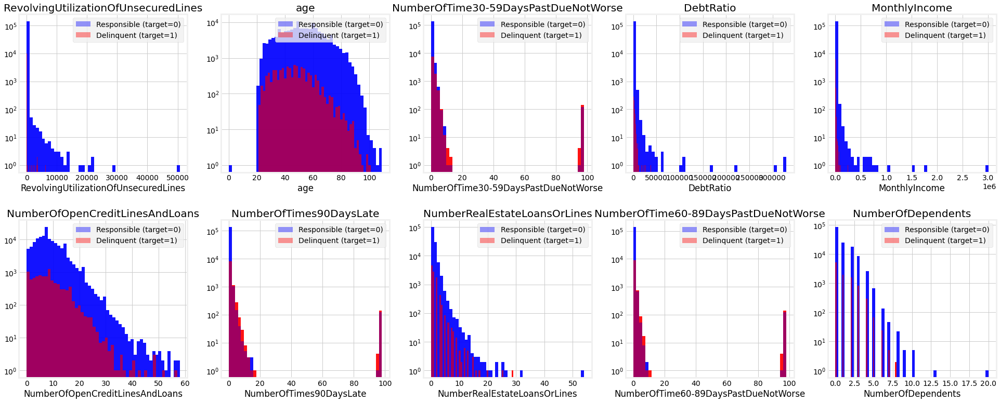

In [47]:
# Visualization
from matplotlib import pyplot as plt
import seaborn as sns

negative_df = df.fillna(0).query("SeriousDlqin2yrs==0")
positive_df = df.fillna(0).query("SeriousDlqin2yrs==1")

with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots(2,5,figsize=(30,12))
    fig.patch.set_facecolor('white')
    plt.subplots_adjust(wspace=0.2, hspace=0.3)
    for i in range(0,5):
        for j in range(0,5):
            sns.distplot(negative_df.iloc[:,1+i], ax=ax[0,i], kde=False, color="blue", label="Responsible (target=0)")
            sns.distplot(positive_df.iloc[:,1+i], ax=ax[0,i], kde=False, color="red", label="Delinquent (target=1)")
            ax[0,i].set_title("{}".format(negative_df.columns[1+i]))
            ax[0,i].set_yscale("log")
            ax[0,i].patch.set_facecolor('white')
            ax[0,i].legend(labels=["Responsible (target=0)", "Delinquent (target=1)"])
            sns.distplot(negative_df.iloc[:,6+j], ax=ax[1,j], kde=False, color="blue", label="Responsible (target=0)")
            sns.distplot(positive_df.iloc[:,6+j], ax=ax[1,j], kde=False, color="red", label="Delinquent (target=1)")
            ax[1,j].set_title("{}".format(negative_df.columns[6+j]))
            ax[1,j].set_yscale("log")
            ax[1,j].patch.set_facecolor('white')
            ax[1,j].legend(labels=["Responsible (target=0)", "Delinquent (target=1)"])

In [26]:
df.columns

Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [ ]:
import plotly as py
import plotly.graph_objs as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
# Create and style traces
column_to_op = "MonthlyIncome"
trace0 = go.Scatter(
        x=df[(df['SeriousDlqin2yrs']==0) & (df["DebtRatio"]> 10)].reset_index(drop=True).index,
        y=df[(df['SeriousDlqin2yrs']==0) & (df["DebtRatio"]> 10)].reset_index(drop=True)[column_to_op],
        name="Responsible (target=0)",
        line=dict(color="rgb(167, 103, 4)", width=4),
    )
trace1 = go.Scatter(
        x=df[(df['SeriousDlqin2yrs']==1) & (df["DebtRatio"]> 10)].reset_index(drop=True).index,
        y=df[(df['SeriousDlqin2yrs']==1) & (df["DebtRatio"]> 10)].reset_index(drop=True)[column_to_op],
        name="Delinquent (target=1)",
        line=dict(color="rgb(32, 205, 119)", width=4),
    )
data = [trace0, trace1]

    # Edit the layout
layout = dict(
        title="Debt ratio analysis",
        xaxis=dict(title="Target"),
        yaxis=dict(title="DebtRatio"),
    )

fig = dict(data=data, layout=layout)
iplot(fig)

In [52]:
sorted(list(df.SeriousDlqin2yrs.unique()))

[0, 1]

In [66]:
plot_box_plot(df, col_to_plot)

## EXPLORATORY DATA ANALYSIS

In [ ]:
df.info()

In [ ]:
df.describe().round(2)

In [ ]:
df.describe()[cols[:6]].round(2)

In [ ]:
df.describe()[cols[6:]].round(2)

In [ ]:
df_nulls = pd.DataFrame(df.copy().isnull().sum())#.reset_index()
df_nulls.columns= ["null_quantity"]
df_nulls.index.name = 'column_names'
df_nulls.style.applymap(color_negative_red)

In [ ]:
new_cols = [col.replace("-","to") for col in list(df.columns)]
df.columns = new_cols

In [ ]:
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
y, X = dmatrices('SeriousDlqin2yrs ~' + "+".join(new_cols[1:]), df, return_type='dataframe')
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

In [ ]:
vif.round(2)

In [ ]:
plot_target_balance(df.SeriousDlqin2yrs.value_counts())

In [ ]:
df_target_zero = df[(df.SeriousDlqin2yrs == 0) & (df.RevolvingUtilizationOfUnsecuredLines < 20) & (df['NumberOfTime60-89DaysPastDueNotWorse'] < 15000)]
df_target_one = df[(df.SeriousDlqin2yrs == 1) & (df.RevolvingUtilizationOfUnsecuredLines < 20) & (df['NumberOfTime60-89DaysPastDueNotWorse'] < 15000)]

In [ ]:
# Add histogram data
x0 = df.loc[(df['SeriousDlqin2yrs']==0), 
            'age']
x1 = df.loc[(df['SeriousDlqin2yrs']==1), 
            'age']

# Group data together
hist_data = [x0, x1]

group_labels = ['Responsible (target=0)', 'Delinquent (target=1)']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# Add title
fig.update_layout(title_text='Kernel Density Estimate',
              xaxis = dict(title = 'age'),
              yaxis = dict(title = 'Probability Density'),
              )

#fig.show()

In [ ]:
# Add histogram data
x0 = df.loc[(df['SeriousDlqin2yrs']==0), 
            'NumberOfDependents'].fillna(0)
x1 = df.loc[(df['SeriousDlqin2yrs']==1), 
            'NumberOfDependents'].fillna(0)

# Group data together
hist_data = [x0, x1]

group_labels = ['Responsible (target=0)', 'Delinquent (target=1)']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# Add title
fig.update_layout(title_text='Kernel Density Estimate - NumberOfDependents',
              xaxis = dict(title = 'NumberOfDependents'),
              yaxis = dict(title = 'Probability Density'),
              )

fig.show()

In [ ]:
df_target_zero = df[(df.SeriousDlqin2yrs == 0) ]
df_target_one = df[(df.SeriousDlqin2yrs == 1) ]

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'RevolvingUtilizationOfUnsecuredLines', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'NumberOfTime30-59DaysPastDueNotWorse', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'DebtRatio', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'MonthlyIncome', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'NumberOfOpenCreditLinesAndLoans', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'NumberOfTimes90DaysLate', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'NumberRealEstateLoansOrLines', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'NumberOfTime60-89DaysPastDueNotWorse', 'Avg')

In [ ]:
plot_trace_line(df_target_zero, df_target_one, 'NumberOfDependents', 'Avg')

In [ ]:
plot_scatter_matrix(df)

In [ ]:
df.corr()

In [ ]:
cor=df.corr()
correlation_heatmap(cor)

In [ ]:
list(np.log10(df.DebtRatio))
list(np.log10(df.MonthlyIncome))

In [ ]:
import plotly.graph_objs as go

fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=list(np.log10(df_target_zero.MonthlyIncome)), 
                         y=list(np.log10(df_target_zero.DebtRatio)), mode='markers',  
                         marker=dict(color='blue')), name= "TARGET = 0")
fig.add_trace(go.Scatter(x=list(np.log10(df_target_one.MonthlyIncome)), 
                         y=list(np.log10(df_target_one.DebtRatio)), mode='markers',  
                         marker=dict(color='red')))

fig.update_layout(title='DebtRatio vs MonthlyIncome',
                  xaxis = dict(title = 'MonthlyIncome'),
              yaxis = dict(title = 'DebtRatio'))
fig.show()

In [ ]:
# Add histogram data
x0 = df.loc[(df['SeriousDlqin2yrs']==0), 
            'DebtRatio']
x1 = df.loc[(df['SeriousDlqin2yrs']==1), 
            'age']

# Group data together
hist_data = [x0, x1]

group_labels = ['TARGET = 0', 'TARGET = 1']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# Add title
fig.update_layout(title_text='Kernel Density Estimate',
              xaxis = dict(title = 'age'),
              yaxis = dict(title = 'Probability Density'),
              )

#fig.show()

## DF CLEANED

In [59]:
df_cleaned = clean_outliers(df.copy())

In [64]:

import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
data = [go.Box(
    y=df_cleaned.fillna(0)[(df_cleaned.SeriousDlqin2yrs==x)]['RevolvingUtilizationOfUnsecuredLines'], name = str(x))  for x in sorted(list(df.SeriousDlqin2yrs.unique()))]


layout = dict(title= "Boxplot de Caracteres escritos para cada religión", 
          xaxis= {"title": "Religiones"}, 
        yaxis= {"title": "Caracteres escritos"})


fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [ ]:
data_target = df.copy()['SeriousDlqin2yrs'].replace(0, "Responsible (target=0)").replace(1,"Delinquent (target=1)")
data_df = df.copy()
data_df['SeriousDlqin2yrs'] = data_target

In [ ]:
sorted(list(data_df['SeriousDlqin2yrs'].unique()))

In [ ]:
import plotly.graph_objs as go
data = [go.Box(
    y=data_df[(data_df['SeriousDlqin2yrs']==x)]['DebtRatio'], name = x)  for x in sorted(list(data_df['SeriousDlqin2yrs'].unique()), reverse=True)]


layout = dict(title= "Boxplot - DebtRatio", 
          xaxis= {"title": "SeriousDlqin2yrs"}, 
        yaxis= {"title": "DebtRatio"})


fig = go.Figure(data=data, layout=layout)
fig.show()

In [ ]:
import plotly.graph_objs as go
data = [go.Box(
    y=data_df[(data_df['SeriousDlqin2yrs']==x)]['RevolvingUtilizationOfUnsecuredLines'], name = x)  for x in sorted(list(data_df['SeriousDlqin2yrs'].unique()), reverse=True)]


layout = dict(title= "Boxplot - DebtRatio", 
          xaxis= {"title": "SeriousDlqin2yrs"}, 
        yaxis= {"title": "RevolvingUtilizationOfUnsecuredLines"})


fig = go.Figure(data=data, layout=layout)
fig.show()

In [ ]:
df_target_zero = df[df.SeriousDlqin2yrs == 0]
df_target_one = df[df.SeriousDlqin2yrs == 1]

In [ ]:
from utils import plot_trace_line2

In [ ]:
plot_trace_line2(df_target_zero, df_target_one, 'RevolvingUtilizationOfUnsecuredLines', 'Avg')

In [ ]:
plot_trace_line2(df_target_zero, df_target_one, 'DebtRatio', 'Avg')

In [ ]:
plot_trace_line2(df_target_zero, df_target_one, 'MonthlyIncome', 'Avg')

In [ ]:
plot_trace_line2(df_target_zero, df_target_one, 'NumberOfOpenCreditLinesAndLoans', 'Avg')

In [ ]:
plot_trace_line2(df_target_zero, df_target_one, 'NumberOfDependents', 'Avg')

In [ ]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
def plot_target_balance(target_value_counts):
    """
    Plot target balance
    
    Args:
        - target_value_counts(pd.Series object): Serie that contains counts of each instance of target variable.
    """
    data = [
        go.Bar(
            x=["Responsible (target=0)"],
            y=[target_value_counts[0]],
            marker=dict(color="cornflowerblue"),
            name="Responsible (target=0)",
        ),
        go.Bar(
            x=["Delinquent (target=1)"],
            y=[target_value_counts[1]],
            marker=dict(color="darksalmon"),
            name="Delinquent (target=1)",
        ),
    ]
    layout = dict(
        title="Proporción del target",
        xaxis=dict(title="Target value"),
        yaxis=dict(title="Count"),
    )
    fig = dict(data=data, layout=layout)
    iplot(fig)

In [ ]:
plot_target_balance(df.SeriousDlqin2yrs.value_counts())